In [ ]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image
import urllib.request
import cv2

import math
import itertools

In [ ]:
url = "https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png"
urllib.request.urlretrieve(url, "image.jpg")

('image.jpg', <http.client.HTTPMessage at 0x781c88d90580>)

In [ ]:
def show(img: np.ndarray) -> None:
    plt.imshow(img, cmap='gray')
    plt.axis('off')

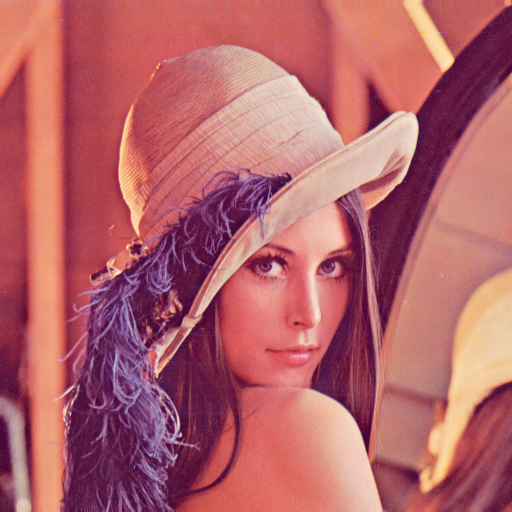

In [ ]:
lena = Image.open('image.jpg')
np_lena = np.array(lena)
lena

In [ ]:
def grayscale(img: np.ndarray, mode: str = 'pseudo') -> None:
    """
    Parameters
    ----------
    img: np.ndarray
        Source image presented in numpy array-like object
    mode: str = 'pseudo' | 'true'
        'pseudo' (default):
            Simple implementation of converting image to grayscale.
                (r+g+b)/3
        'true':
             Implementation of converting image to grayscale using coefficients.
                (0.299R + 0.587G + 0.114B)
    """
    assert mode in ['pseudo', 'true'], f'Unknown mode {mode}. Parameter mode must be one of {["pseudo", "true"]}'
    tmp = img.astype(np.float16)/255
    if mode == 'pseudo':
        tmp = np.sum(tmp/3, axis=2)
#         plt.imshow(np.expand_dims(tmp, 2), cmap='gray')
    else:
        tmp = 0.299*tmp[:,:,0]+0.587*tmp[:,:,1]+0.144*tmp[:,:,2]
#         plt.imshow(np.expand_dims(tmp, 2), cmap='gray')

#     plt.axis('off')
#     plt.show()
    return tmp

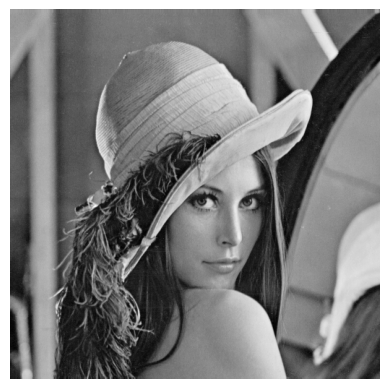

In [ ]:
np_lena_mc = grayscale(np_lena, 'true')
show(np_lena_mc)

In [ ]:
l = (np_lena_mc*255).astype(np.uint8)

## Задание 1

**Работа с шумом**

In [ ]:
def noise(img: np.ndarray, noise_type: str, strength: float, sigm: float = 1) -> np.ndarray:
    """
    Parameters
    ----------
    img: np.ndarray
        Source image presented in numpy array-like object

    noise_type: str
        's&p': Adds random black and while pixels, depending on `strength` parameter
        'impulse': Adds random while pixels, depending on `strength` parameter
        'gauss': Adds Gaussian noise form Gaussian distribution with parameters (0, `sigm`)

    strength: float
        The strength of noise. Must be a number from (0, 1]
        Ignored if 'gauss' `noise_type` is selected

    sigm: float
        The standart deviation parameter for Gaussian distibution
    """

    assert noise_type in ['s&p', 'impulse', 'gauss']
    if noise_type != 'gauss':
        assert 0 < strength <= 1
    else:
        assert sigm

    tmp = img.copy()

    if noise_type == 's&p':
        for y in range(img.shape[0]):
            for x in range(img.shape[1]):
                if np.random.rand() < strength:
                    tmp[y][x] = np.random.choice([255, 0])
    elif noise_type == 'impulse':
        for y in range(img.shape[0]):
            for x in range(img.shape[1]):
                if np.random.rand() < strength:
                    tmp[y][x] = 255
    else:
        tmp = tmp + np.random.normal(0, sigm, tmp.shape)

    return tmp

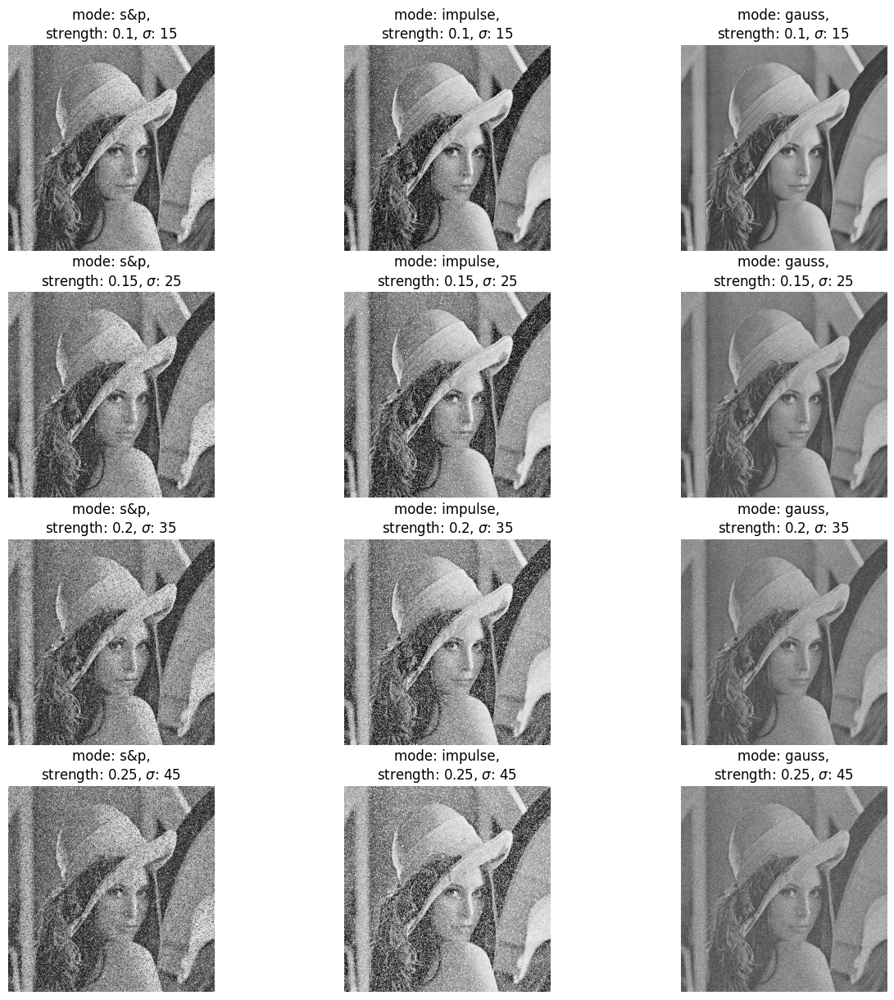

In [ ]:
fig, ax = plt.subplots(4, 3, figsize=(15, 15))

s_params = [0.1, 0.15, 0.2, 0.25]
sigm_params = [15, 25, 35, 45]

for ind, (i, j) in enumerate(list(itertools.product(*[list(range(4)), list(range(3))]))):
    ax[i][j].axis('off')
    m = ['s&p', 'impulse', 'gauss'][j%3]
    ax[i][j].imshow(noise(l, m, s_params[i%4], sigm_params[i%4]), cmap='gray')
    ax[i][j].set_title(f'mode: {m},\nstrength: {s_params[i%4]}, $\sigma$: {sigm_params[i%4]}')

plt.show()

In [ ]:
get_gaussian_kernel = lambda sigma: np.fromfunction(lambda x, y: (1 / (2 * np.pi * sigma**2)) * np.exp(-((x - math.ceil(4*sigma+1)//2)**2 + (y - math.ceil(4*sigma+1)//2)**2) / (2 * sigma**2)), (math.ceil(4*sigma+1), math.ceil(4*sigma+1)))

In [ ]:
get_gaussian_kernel(1)

array([[0.00291502, 0.01306423, 0.02153928, 0.01306423, 0.00291502],
       [0.01306423, 0.05854983, 0.09653235, 0.05854983, 0.01306423],
       [0.02153928, 0.09653235, 0.15915494, 0.09653235, 0.02153928],
       [0.01306423, 0.05854983, 0.09653235, 0.05854983, 0.01306423],
       [0.00291502, 0.01306423, 0.02153928, 0.01306423, 0.00291502]])

In [ ]:
get_box_kernel = lambda size: np.ones((size, size))

In [ ]:
def applyFilter2d(img: np.ndarray, f: np.ndarray) -> np.ndarray:
    tmp = img.copy()
    res = np.zeros_like(img, dtype='int64')
    fs = f.shape[0]//2

    f = np.rot90(f, 2)

    tmp = np.pad(tmp, fs, 'edge')

    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            fy, fx = y+fs, x+fs
            res[y][x] = np.sum(tmp[fy-fs:fy+fs+1, fx-fs:fx+fs+1] * f)

    return res

In [ ]:
def fast_applyFilter2d(img: np.ndarray, f: np.ndarray) -> np.ndarray:
    tmp = np.pad(img, f.shape[0]//2, 'edge')
    f = np.rot90(f, 2)

    windows = np.lib.stride_tricks.sliding_window_view(tmp, f.shape)

    return np.sum(windows * f, axis=(-1, -2))

In [ ]:
def applyMedianFilter2d(img: np.ndarray, size: int) -> np.ndarray:
    tmp = img.copy()
    res = np.zeros_like(img, dtype='int64')
    fs = size//2

    tmp = np.pad(tmp, fs, 'edge')

    for y in range(img.shape[0]):
        for x in range(img.shape[1]):
            fy, fx = y+fs, x+fs
            res[y][x] = np.median(tmp[fy-fs:fy+fs+1, fx-fs:fx+fs+1])

    return res

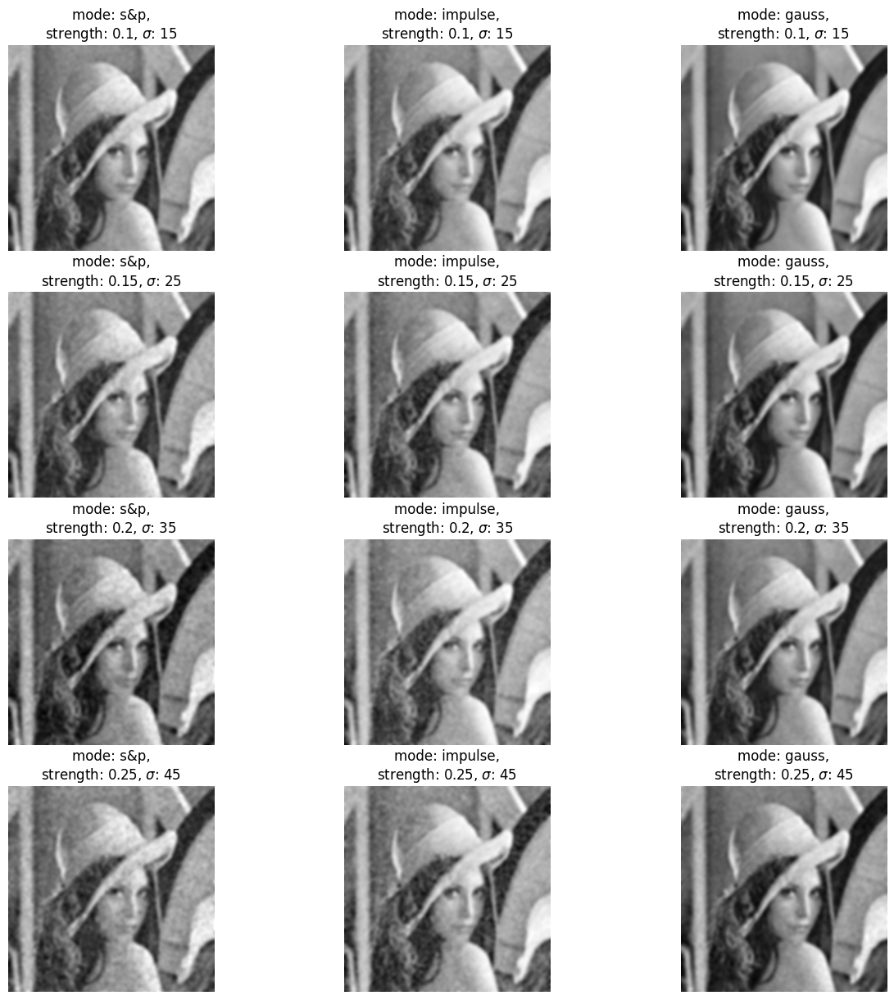

In [ ]:
fig, ax = plt.subplots(4, 3, figsize=(15, 15))

s_params = [0.1, 0.15, 0.2, 0.25]
sigm_params = [15, 25, 35, 45]

for ind, (i, j) in enumerate(list(itertools.product(*[list(range(4)), list(range(3))]))):
    ax[i][j].axis('off')
    m = ['s&p', 'impulse', 'gauss'][j%3]
    noised = noise(l, m, s_params[i%4], sigm_params[i%4])
    denoised = applyFilter2d(noised, get_gaussian_kernel(4))
    ax[i][j].imshow(denoised, cmap='gray')
    ax[i][j].set_title(f'mode: {m},\nstrength: {s_params[i%4]}, $\sigma$: {sigm_params[i%4]}')

plt.show()

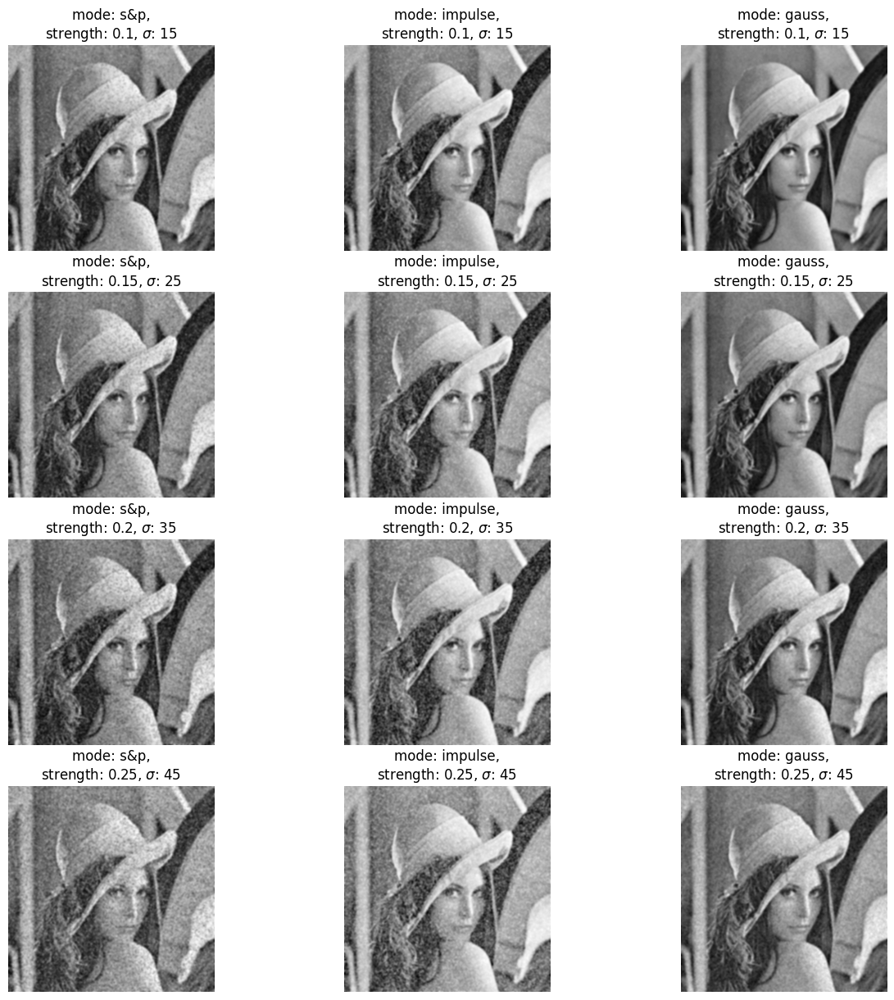

In [ ]:
fig, ax = plt.subplots(4, 3, figsize=(15, 15))

s_params = [0.1, 0.15, 0.2, 0.25]
sigm_params = [15, 25, 35, 45]

for ind, (i, j) in enumerate(list(itertools.product(*[list(range(4)), list(range(3))]))):
    ax[i][j].axis('off')
    m = ['s&p', 'impulse', 'gauss'][j%3]
    noised = noise(l, m, s_params[i%4], sigm_params[i%4])
    denoised = applyFilter2d(noised, get_gaussian_kernel(2))
    ax[i][j].imshow(denoised, cmap='gray')
    ax[i][j].set_title(f'mode: {m},\nstrength: {s_params[i%4]}, $\sigma$: {sigm_params[i%4]}')

plt.show()

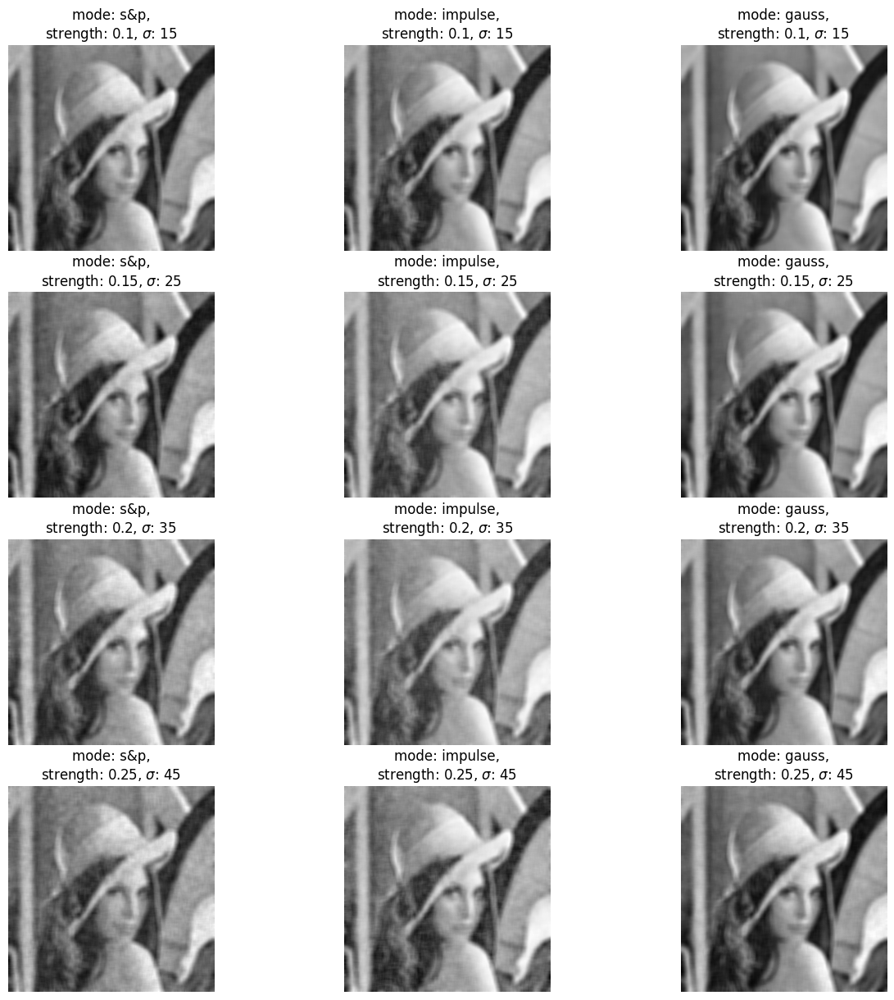

In [ ]:
fig, ax = plt.subplots(4, 3, figsize=(15, 15))

s_params = [0.1, 0.15, 0.2, 0.25]
sigm_params = [15, 25, 35, 45]

for ind, (i, j) in enumerate(list(itertools.product(*[list(range(4)), list(range(3))]))):
    ax[i][j].axis('off')
    m = ['s&p', 'impulse', 'gauss'][j%3]
    noised = noise(l, m, s_params[i%4], sigm_params[i%4])
    denoised = applyFilter2d(noised, get_box_kernel(15))
    ax[i][j].imshow(denoised, cmap='gray')
    ax[i][j].set_title(f'mode: {m},\nstrength: {s_params[i%4]}, $\sigma$: {sigm_params[i%4]}')

plt.show()

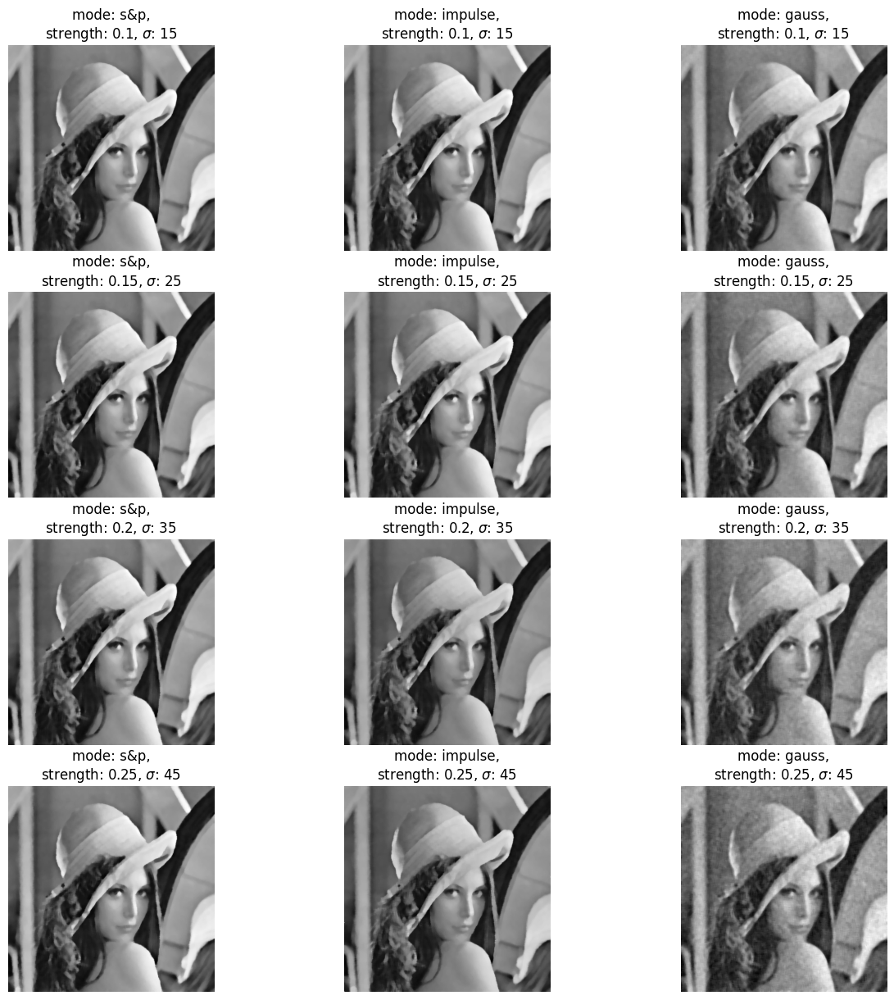

In [ ]:
fig, ax = plt.subplots(4, 3, figsize=(15, 15))

s_params = [0.1, 0.15, 0.2, 0.25]
sigm_params = [15, 25, 35, 45]

for ind, (i, j) in enumerate(list(itertools.product(*[list(range(4)), list(range(3))]))):
    ax[i][j].axis('off')
    m = ['s&p', 'impulse', 'gauss'][j%3]
    noised = noise(l, m, s_params[i%4], sigm_params[i%4])
    denoised = applyMedianFilter2d(noised, 9)
    ax[i][j].imshow(denoised, cmap='gray')
    ax[i][j].set_title(f'mode: {m},\nstrength: {s_params[i%4]}, $\sigma$: {sigm_params[i%4]}')

plt.show()

## Задание 2

**Детекция границ**

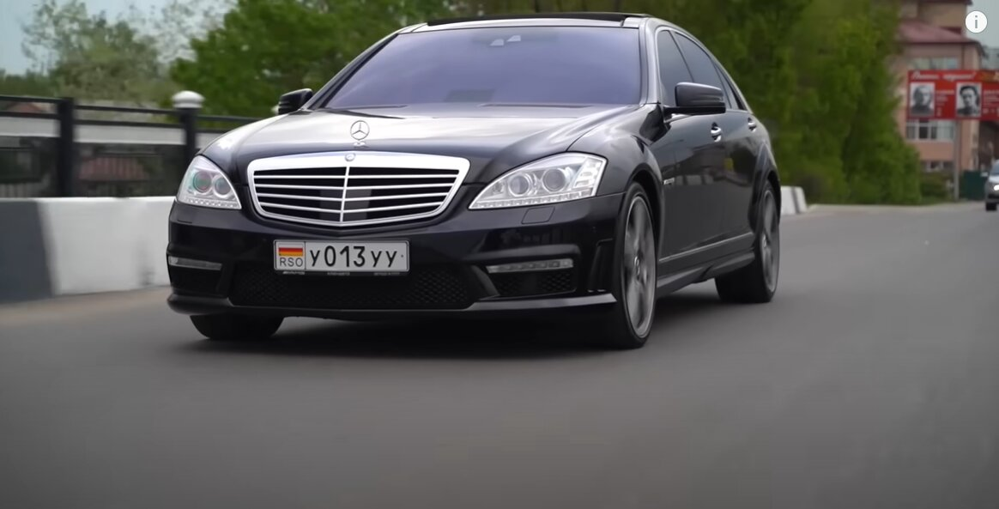

In [ ]:
mercedes = Image.open('s1.jpg')
np_mercedes = np.array(mercedes)
mercedes

In [ ]:
np_mercedes_mc = (grayscale(np_mercedes, 'true')*255).astype(np.uint8)

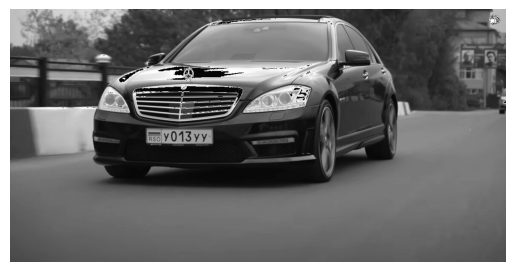

In [ ]:
show(np_mercedes_mc)

In [ ]:
np_mercedes_mc.shape

(593, 1164)

In [ ]:
def non_maximum_suppression(img, D):
    res = np.zeros(img.shape, dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180

    for i in range(1,img.shape[0]-1):
        for j in range(1,img.shape[1]-1):
            q = 255
            r = 255

            if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                q = img[i, j+1]
                r = img[i, j-1]
            elif (22.5 <= angle[i,j] < 67.5):
                q = img[i+1, j-1]
                r = img[i-1, j+1]
            elif (67.5 <= angle[i,j] < 112.5):
                q = img[i+1, j]
                r = img[i-1, j]
            elif (112.5 <= angle[i,j] < 157.5):
                q = img[i-1, j-1]
                r = img[i+1, j+1]

            if (img[i,j] >= q) and (img[i,j] >= r):
                res[i,j] = img[i,j]
            else:
                res[i,j] = 0

    return res


In [ ]:
def threshold_and_trace(img, lowThreshold, highThreshold):

    res = img.copy()

    strong_idx = np.where(res >= highThreshold)
    res = np.where(res >= highThreshold, 255, res)

    res = np.where(res < lowThreshold, 0, res)

    weak_idx = np.where((res < highThreshold) & (res >= lowThreshold))

    res = trace_edges(res, strong_idx, weak_idx)

    return res

In [ ]:
def trace_edges(thresholded_img, strong_idx, weak_idx):
    img = thresholded_img.copy()
    for r, c in zip(strong_idx[0], strong_idx[1]):
        stack = [(r, c)]
        while stack:
            row, col = stack.pop()
            for i in range(-5, 6, 1):
                for j in range(-5, 6, 1):
                    if img.shape[0] > row+i > 0 and img.shape[1] > col+j > 0:
                        if 0 < img[row+i, col+j] < 255:
                            img[row+i, col+j] = 255
                            stack.append((row+i, col+j))

    mask = np.zeros_like(img, dtype=bool)
    mask[weak_idx] = True

    update_mask = (img < 255) & mask

    img[update_mask] = 0

    return img

In [ ]:
def canny_edge_detector(img: np.ndarray, lowThreshold, highThreshold) -> np.ndarray:
    blurred = fast_applyFilter2d(img, get_gaussian_kernel(1))

    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.rot90(sobel_x, 1)

    Gx = fast_applyFilter2d(blurred, sobel_x)
    Gy = fast_applyFilter2d(blurred, sobel_y)

    magnitude = np.sqrt(Gx**2 + Gy**2)

    theta = np.arctan2(Gy, Gx)

    suppressed = non_maximum_suppression(magnitude, theta)

    res = threshold_and_trace(suppressed, lowThreshold, highThreshold)

    return res

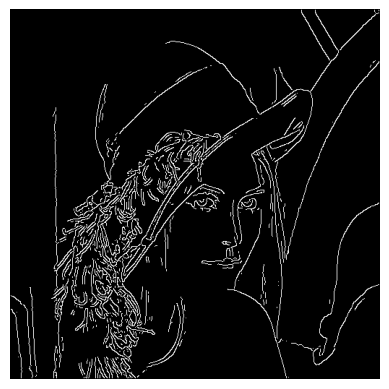

In [ ]:
show(canny_edge_detector(l, 70, 200))

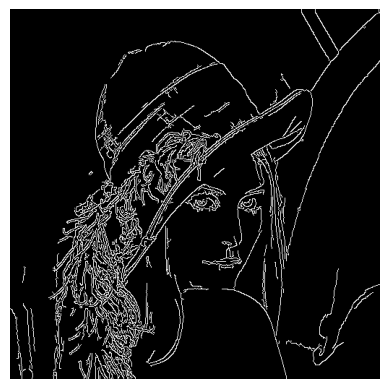

In [ ]:
show(cv2.Canny(l,70,200))

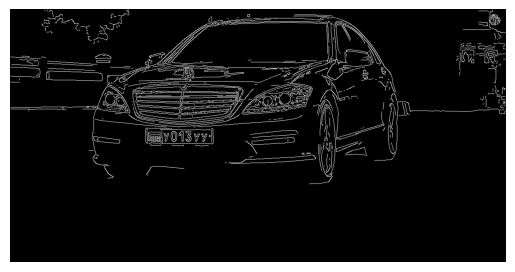

In [ ]:
show(canny_edge_detector(np_mercedes_mc, 70, 200))

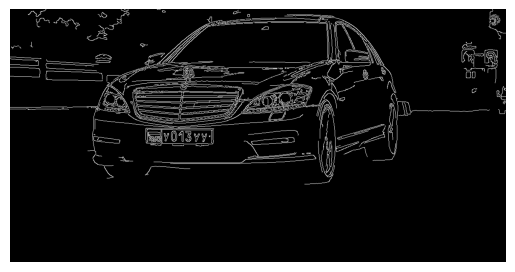

In [ ]:
show(cv2.Canny(np_mercedes_mc,70,200))

## Задание 3

**Детекция углов**

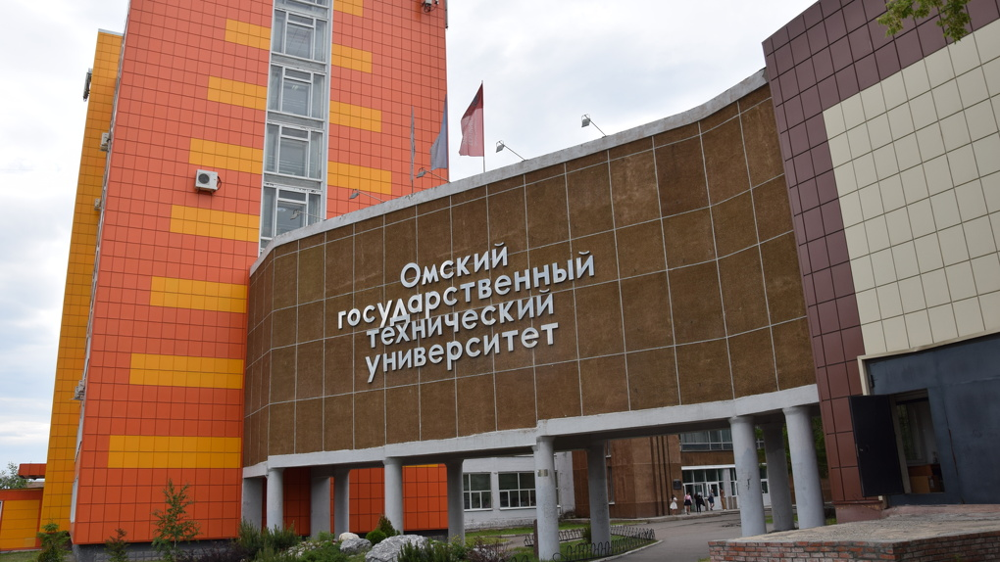

In [ ]:
corners = Image.open('OmSTU.jpg')
np_corners = np.array(corners)
corners

In [ ]:
np_corners.shape

(574, 1020, 3)

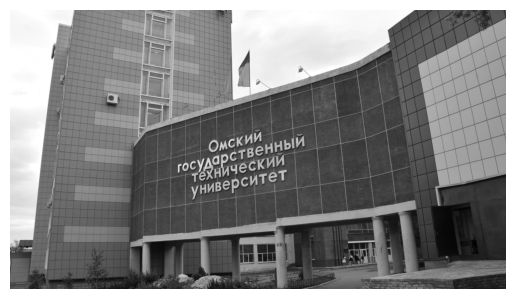

In [ ]:
np_corners_mc = grayscale(np_corners, 'true')
show(np_corners_mc)

In [ ]:
def detect_harris(img: np.ndarray) -> np.ndarray:

    tmp = grayscale(img) if len(img.shape) == 3 and img.shape[2] == 3 else img.copy()

    blurred = fast_applyFilter2d(tmp, get_gaussian_kernel(1))

    sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
    sobel_y = np.rot90(sobel_x, 1)

    Ix = fast_applyFilter2d(blurred, sobel_x)
    Iy = fast_applyFilter2d(blurred, sobel_y)

    Ixx = Ix**2
    Ixy = Iy*Ix
    Iyy = Iy**2

    k = 0.05

    detA = Ixx * Iyy - Ixy ** 2
    traceA = Ixx + Iyy

    harris_response = detA - k * traceA ** 2

    Sxx = fast_applyFilter2d(Ixx, get_box_kernel(3))
    Sxy = fast_applyFilter2d(Ixy, get_box_kernel(3))
    Syy = fast_applyFilter2d(Iyy, get_box_kernel(3))

    det = (Sxx * Syy) - (Sxy**2)
    trace = Sxx + Syy
    r = det - k*(trace**2)

    return r

In [ ]:
def mark_corners(img: np.ndarray, harris_output: np.ndarray, threshold: float, topk: int = 100) -> np.ndarray:

    assert len(img.shape) == 3 and img.shape[2] == 3, 'Image must be presented in RGB format'

    mask_c = np.zeros_like(img[:,:,0], dtype=bool)
    mask_t = np.zeros_like(img[:,:,0], dtype=bool) if topk > 0 else np.ones_like(img[:,:,0], dtype=bool)
    c = np.where(harris_output >= threshold)
    mask_c[c] = True

    if topk > 0:
        t = np.unravel_index(np.argpartition(harris_output.ravel(),-topk)[-topk:], harris_output.shape)
        mask_t[t] = True

    mask = mask_c & mask_t if topk > 0 else mask_c

    t = img.copy()
    res_ind = np.where(mask)
    for row, col in zip(res_ind[0], res_ind[1]):
        for i in range(-3, 4):
            if t.shape[0] > row+i > 0:
                t[:,:,0][row+i, col] = 255
                t[:,:,1][row+i, col] = 0
                t[:,:,2][row+i, col] = 0
        for j in range(-3, 4):
            if t.shape[1] > col+j > 0:
                t[:,:,0][row, col+j] = 255
                t[:,:,1][row, col+j] = 0
                t[:,:,2][row, col+j] = 0


    return t

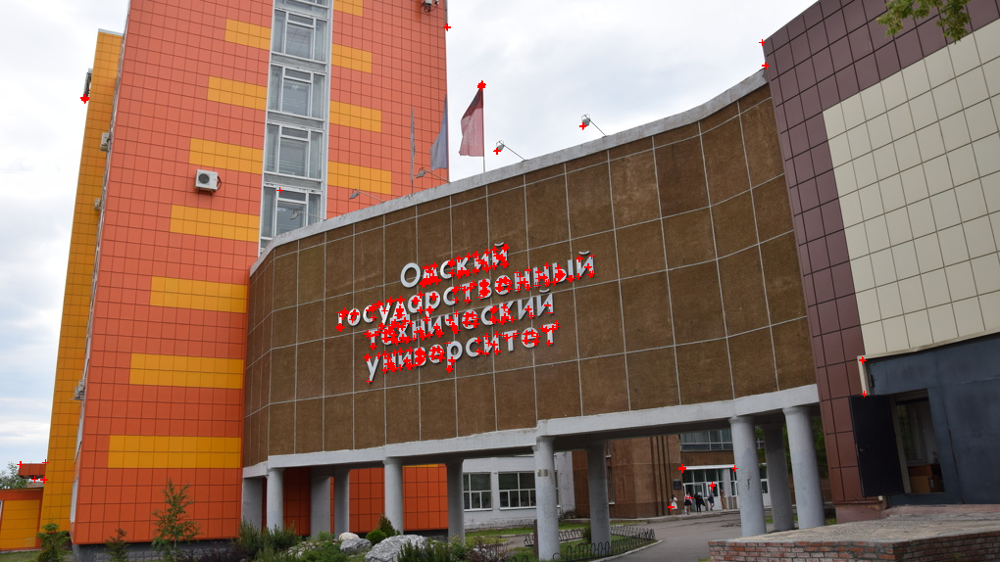

In [ ]:
Image.fromarray(mark_corners(np_corners, detect_harris(np_corners_mc), 0.1, 800))

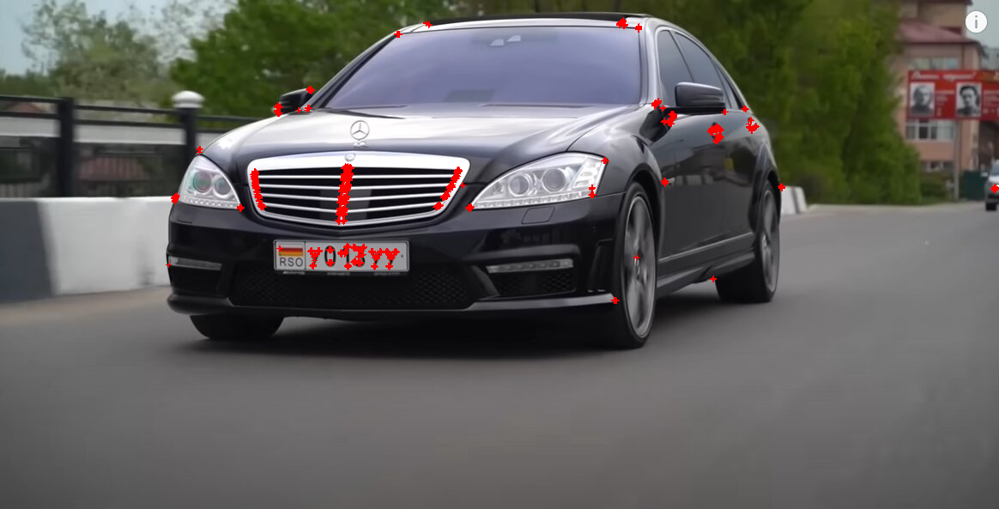

In [ ]:
Image.fromarray(mark_corners(np_mercedes, detect_harris(np_mercedes), 0.1, 1000))